In [11]:
%matplotlib inline
# All imports

from random import choice
from sklearn.model_selection import GridSearchCV
import numpy as np
import matplotlib.pyplot as plt
from copy import copy
import time
from IPython import display
from sklearn.model_selection import train_test_split

import sklearn
from sklearn.neural_network import MLPRegressor, MLPClassifier
from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split

np.set_printoptions(formatter={'float': '{:.5f}'.format})
print(sklearn.__version__)
from scipy import stats
from sklearn import datasets


0.19.1


In [12]:
lfw_people = datasets.fetch_lfw_people(min_faces_per_person=70, \
                                       resize=0.4)

# introspect the images arrays to find the shapes (for plotting)
n_samples, h, w = lfw_people.images.shape
print('height and width of images:', h, w)

# The images in X have been collapsed into a 1D array
# just like for the handwritten digits
X = lfw_people.data

# X.shape[0] tells you the number of images (faces);
# this is the same as n_samples ahove
# X.shape[1] gives the number of pixels for each image
# or, "features"

print('X.shape', X.shape)
n_features = X.shape[1]


# the label/target to predict is the id of the person -- y is an integer
y = lfw_people.target
# target_names are actually names
target_names = lfw_people.target_names
print('target_names.shape', target_names.shape)
print('target_names', target_names)

# n_classes gives the number of people 
# Different from the number of faces (n_samples)!!
n_classes = target_names.shape[0]

print("Total dataset size:")
print("n_samples (number of faces): {0}".format(n_samples))
# n_features = 1850, which is 50x37, the dimension of the images.
print("n_features (number of pixels): {0}".format(n_features))
print("n_classes (number of people): {0}".format(n_classes))

height and width of images: 50 37
X.shape (1288, 1850)
target_names.shape (7,)
target_names ['Ariel Sharon' 'Colin Powell' 'Donald Rumsfeld' 'George W Bush'
 'Gerhard Schroeder' 'Hugo Chavez' 'Tony Blair']
Total dataset size:
n_samples (number of faces): 1288
n_features (number of pixels): 1850
n_classes (number of people): 7


In [3]:
# def clf_faces(X,y,test_size,solver,alpha,hidden_layers, activation, random_state, learning_rate):
    
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)
    
#     faces_clf = MLPClassifier(solver="adam", alpha = 1e-05,hidden_layer_sizes=(500,), activation = 'relu', \
#                     random_state=50, max_iter=1000000, learning_rate_init = 0.01)
    
#     faces_clf.fit(X_train,y_train)
#     predict_test = faces_clf.predict(X_test)
#     predict_train = faces_clf.predict(X_train)
#     Z_test = (predict_test == y_test)
#     Z_train = (predict_train == y_train)
#     print(np.sum(Z_test)/Z_test.shape[0])
#     print(np.sum(Z_train)/Z_train.shape[0])

In [4]:
# clf_faces()

In [5]:
# parameters = {'solver': ['lbfgs'], 'alpha': np.arange(0.5,0.6,0.01), 'hidden_layer_sizes':[(5,14)], \
#               'random_state':[10], 'max_iter':[1e04],'learning_rate':['invscaling'],'learning_rate_init' : np.arange(.7,1.3,0.1)}
# grid_clf = GridSearchCV(MLPClassifier(), parameters, n_jobs=-1,verbose = 2)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)



In [6]:
# grid_clf.fit(X_train, y_train)
# print("Best score: %0.4f" % grid_clf.best_score_)
# print("Using the following parameters:")
# print(grid_clf.best_params_)



In [7]:
# faces_clf = MLPClassifier(solver="lbfgs", alpha = 13.5,hidden_layer_sizes=(5,), activation = 'relu', \
#                     random_state=10, max_iter=1e04, learning_rate_init = 1,learning_rate =  'invscaling')

In [8]:
import time

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)
faces_clf = MLPClassifier(solver="lbfgs", alpha = .575,hidden_layer_sizes=(5,14), activation = 'relu', \
                random_state=10, max_iter=1e04, learning_rate_init = .7,learning_rate =  'invscaling')

In [18]:
faces_clf = MLPClassifier(solver="lbfgs", alpha = .575,hidden_layer_sizes=(5,14), activation = 'relu', \
                random_state=10, max_iter=1e04, learning_rate_init = .7,learning_rate =  'invscaling')
start = time.time()
faces_clf.fit(X_train,y_train)
end = time.time()
predict = faces_clf.predict(X_test)
print("Training Time: %0.2f" % ((end - start)) + " seconds")
percent_correct = 100*np.sum((y_test==predict)/y_test.shape[0])
print("Percent Correct: %0.8f" % percent_correct +"%")


Training Time: 54.82 seconds
Percent Correct: 60.72351421%


# MLP CLASSIFIER OF DIGITS:

In [57]:
digits = datasets.load_digits()
digimg = digits.images
targets = digits.target
digimg = digimg.reshape(-1,64)


In [58]:
digimg.shape

(1797, 64)

In [197]:
dig_clf = MLPClassifier(solver="lbfgs", alpha = 0.1,hidden_layer_sizes=(500,250,125,10), activation = 'relu', \
                        random_state=10, max_iter=1e010, learning_rate_init = 1,learning_rate =  'invscaling')

In [198]:
dig_train, dig_test, targ_train, targ_test = train_test_split(digimg, targets, test_size=0.30)

0


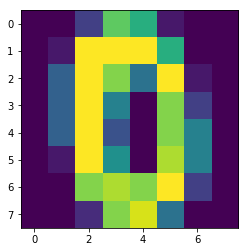

In [199]:
plt.imshow(dig_test[0].reshape(8,8))
print(targ_test[0])

In [200]:
start = time.time()
dig_clf.fit(dig_train,targ_train)
end = time.time()

In [201]:
dig_predict = dig_clf.predict(dig_test)
print("Training Time: %0.2f" % ((end - start)) + " seconds")
dig_percent_correct = 100*np.sum((targ_test==dig_predict)/dig_test.shape[0])
print("Percent Correct: %0.8f" % dig_percent_correct +"%")

Training Time: 87.53 seconds
Percent Correct: 97.77777778%


In [13]:
proba = dig_clf.predict_proba(dig_test)


NameError: name 'dig_clf' is not defined

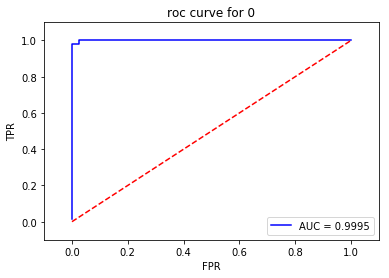

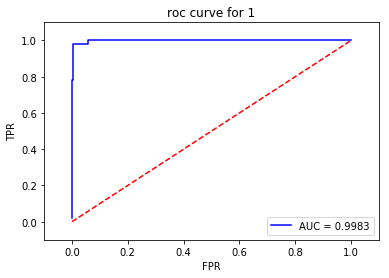

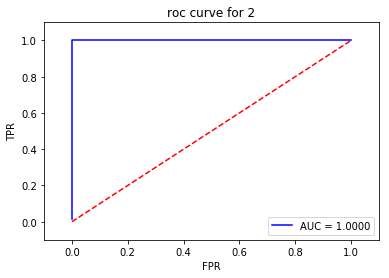

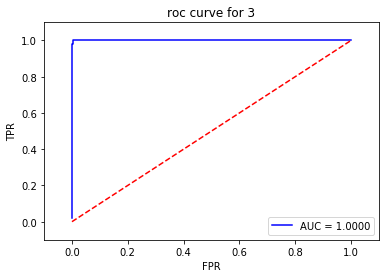

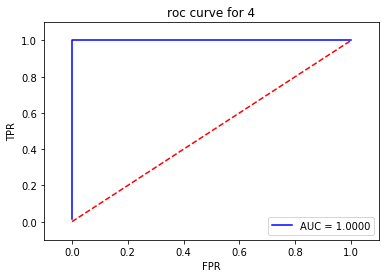

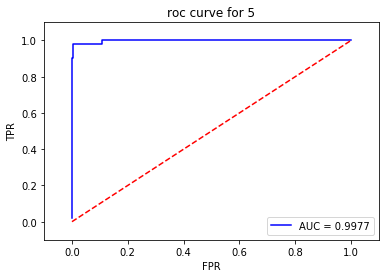

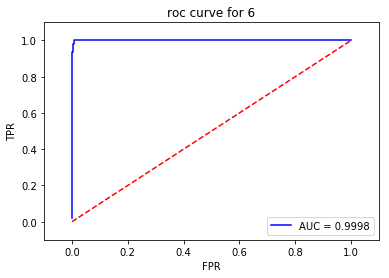

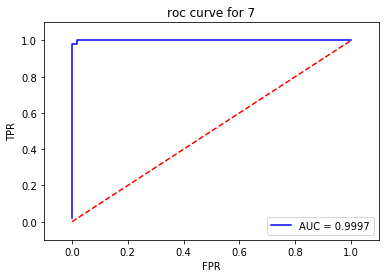

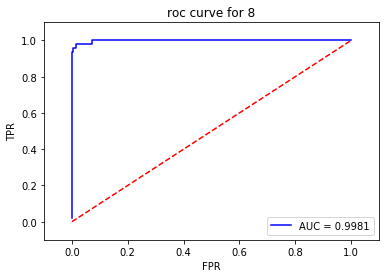

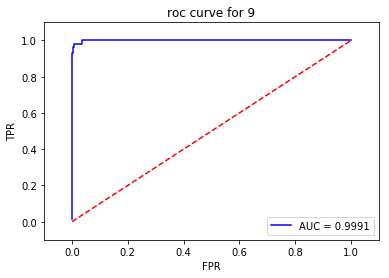

In [218]:
from sklearn import metrics
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(10):
    preds = proba[:,i]
    fpr[i],tpr[i],threshold = metrics.roc_curve(targ_test,preds, pos_label = i)
    roc_auc[i] = metrics.auc(fpr[i],tpr[i]) 
    plt.title('roc curve for {}'.format(i))
    plt.plot(fpr[i], tpr[i], 'b', label = 'AUC = %0.4f' % roc_auc[i])
    plt.legend(loc = 'lower right')
    plt.plot([0,1],[0,1], 'r--')
    plt.xlim([-0.1,1.1])
    plt.ylim([-0.1,1.1])
    plt.ylabel('TPR')
    plt.xlabel('FPR')
    plt.show()

# USING NN ON SDSS IMGS:



In [1485]:
import matplotlib.image as mpimg
import time
from astropy.table import Table
import numpy as np
import matplotlib.pyplot as plt
from os.path import expanduser
from astropy.io import fits
from astropy.utils.data import download_file

In [1486]:

imgs = 25
dir_path = '//Volumes/CJSTORFER/'
cat = Table.read(dir_path+'GroundBasedTraining/classifications.csv')
cat= cat[0:imgs]

ims = np.zeros((imgs, 4, 101, 101))
counter = 0


for i, id in enumerate(cat['ID']):
    if (i%10 == 0):
        counter +=1
        print (str(counter)+"0 done.")
    for j, b in enumerate(['R', 'I', 'G', 'U']):
        ims[i, j] = fits.getdata(dir_path+'GroundBasedTraining/Public/Band'+str(j+1)+'/imageSDSS_'+b+'-'+str(id)+'.fits')

10 done.
20 done.
30 done.


In [1487]:
X = np.copy(ims)

In [1488]:
y = np.asarray(cat['is_lens'])

In [1489]:
X.shape

(25, 4, 101, 101)

In [1490]:
X_0 = np.copy(X[0])
X_0.shape

(4, 101, 101)

3.91818695544
9.27819140961
2.87277718974
1.7955607487
17.8647163035
0.219325450731 0.519358452269 0.160807322151 0.100508774849


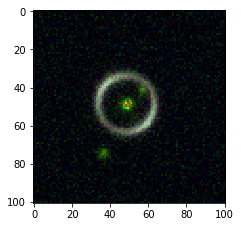

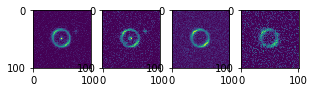

1.17458759732
3.07218417372
0.834269112127
0.881672339303
5.96271322248
0.196988779017 0.515232589443 0.139914344527 0.147864287013


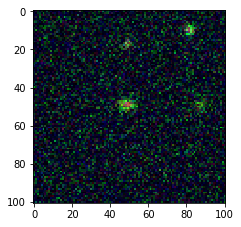

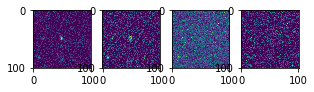

3.2455337029
5.58506470238
1.11439971834
0.884007277102
10.8290054007
0.299707459993 0.515750477141 0.102908778517 0.0816332843497


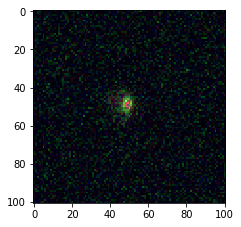

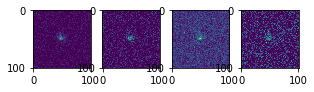

170.842306968
189.802329409
144.783340872
1e+13
1.00000000005e+13
1.70842306959e-11 1.89802329399e-11 1.44783340865e-11 0.999999999949


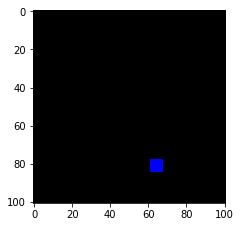

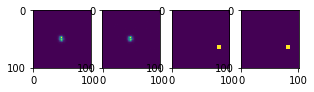

1.75841580879
2.90724753299
0.53508577777
0.850940585356
6.05168970491
0.2905660889 0.480402610635 0.0884192355956 0.140612064869


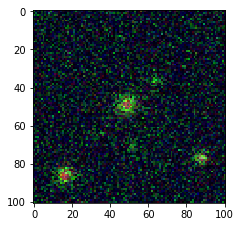

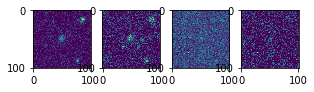

74.121236926
6.04765820755
5.37211525264
73.2542526638
158.79526305
0.46677234259 0.0380846260234 0.0338304502884 0.461312581099


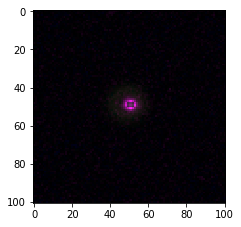

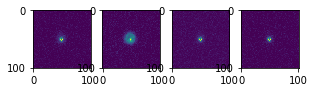

1e+13
1e+13
0.527011117038
0.797107605616
2e+13
0.5 0.5 2.63505558519e-14 3.98553802808e-14


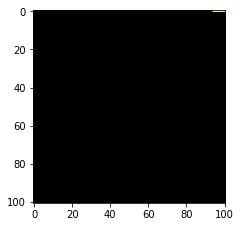

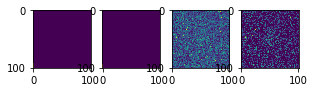

2.59950515974
5.68832307646
2.82719698347
1.57345872442
12.6884839441
0.204871217964 0.448305967957 0.222815979902 0.124006834178


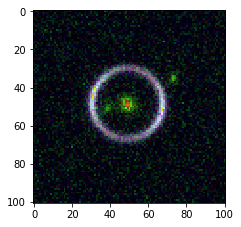

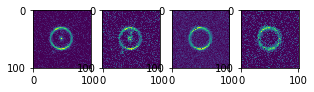

1.35827269571
2.9576341376
1.10055003305
1e+13
1e+13
1.35827269571e-13 2.9576341376e-13 1.10055003305e-13 0.999999999999


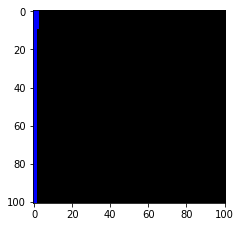

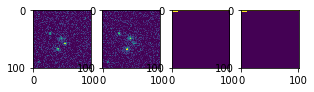

1.55489857101
2.72752532365
1.1497153056
0.871939239561
6.30407843982
0.246649623074 0.432660435572 0.182376427669 0.138313513685


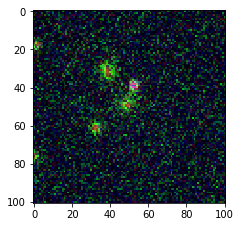

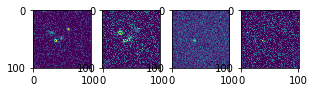

37.6299630345
32.965941088
7.45535577718
2.36133421844
80.4125941181
0.467961063154 0.409959925427 0.0927137826971 0.0293652287224


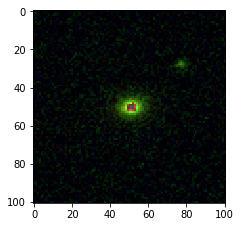

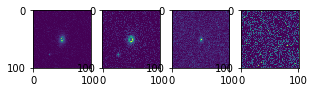

1.79570785325
20.9900513637
20.9900513637
1.79570785325
45.5715184339
0.0394041698622 0.460595830138 0.460595830138 0.0394041698622


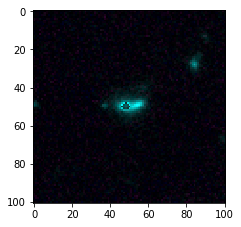

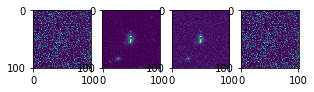

4.05234804046
4.33353422591
4.02776145769
2.68254064795
15.096184372
0.268435250962 0.28706155934 0.266806588899 0.177696600799


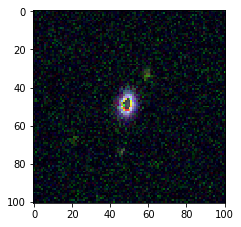

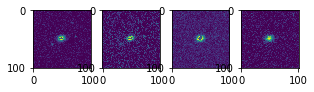

1.96952124748
38.1933623617
38.1933623617
1.96952124748
80.3257672183
0.0245191713156 0.475480828684 0.475480828684 0.0245191713156


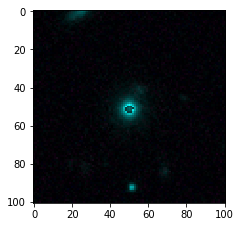

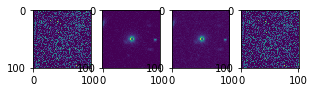

2.50899127863
7.10006567428
0.739347992551
0.824932223226
11.1733371687
0.224551648335 0.635447187093 0.0661707403427 0.0738304242297


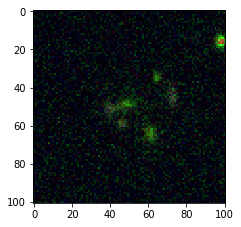

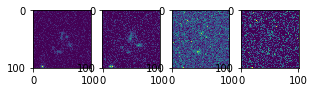

26.184909796
40.3445027386
5.89762891301
0.792561415802
73.2196028634
0.357621576354 0.55100685009 0.0805471305821 0.0108244429744


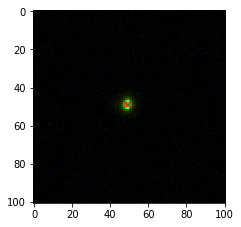

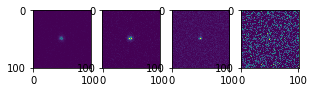

52.7200283429
243.357400898
14.8723394711
4.00940045053
314.959169162
0.167386866314 0.772663331393 0.0472198968223 0.0127299054706


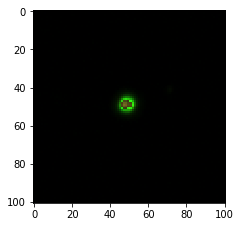

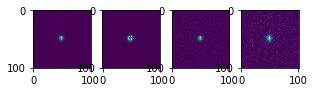

55.517501707
90.1561436617
11.296522745
1.17694352528
158.147111639
0.351049735475 0.570077712627 0.0714304714638 0.00744208043435


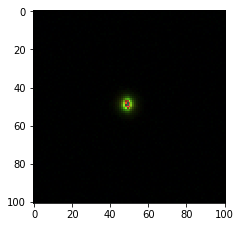

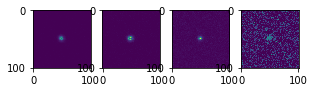

1.3195205345
2.43701777508
0.922344839394
0.737378907933
5.41626205691
0.243621988862 0.449944583455 0.170291767588 0.136141660094


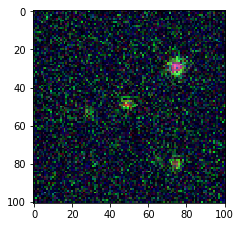

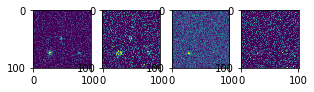

1.07169360192
2.83100383414
1.02161612503
0.862019657044
5.78633321813
0.185211179778 0.489256965926 0.176556739219 0.148975115077


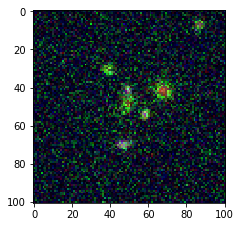

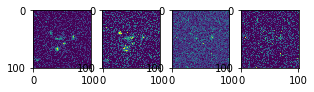

37.3551523047
58.3091241957
8.68292659995
0.9940748745
105.341277975
0.354610775784 0.553525885737 0.0824266305371 0.00943670794213


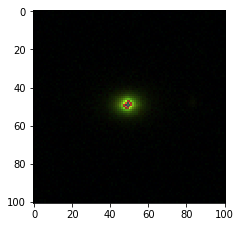

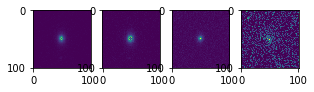

1e+13
1897.89481908
1021.13668632
196.128402408
1.00000000031e+13
0.999999999688 1.89789481849e-10 1.021136686e-10 1.96128402347e-11


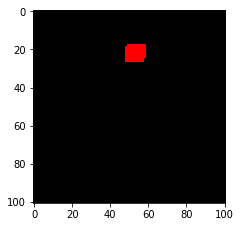

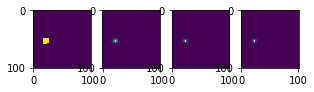

57.0628322372
92.3258525187
22.4014751193
1e+13
1.00000000002e+13
5.70628322362e-12 9.23258525171e-12 2.2401475119e-12 0.999999999983


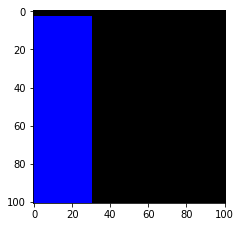

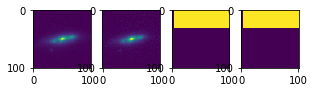

1e+13
44.8467568637
7.05063923911
1.35349665503
1.00000000001e+13
0.999999999995 4.48467568634e-12 7.05063923908e-13 1.35349665502e-13


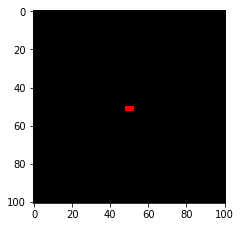

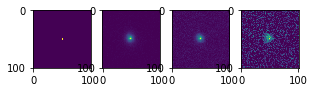

9.75787922686
22.4967947049
2.14996978554
0.756100130422
35.1607438477
0.277521979316 0.639827041269 0.0611468800219 0.0215040993927


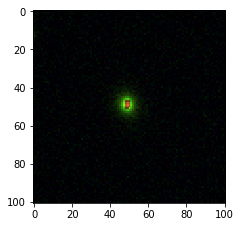

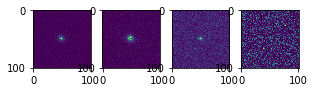

In [1491]:
for i in range(X.shape[0]):
    X_0 = X[i]

    max0=X_0[0].max()*1e11
    max1=X_0[1].max()*1e11
    max2=X_0[2].max()*1e11
    max3=X_0[3].max()*1e11
    
    print(max0)
    print(max1)
    print(max2)
    print(max3)
    
    sum = (max0+max1+max2+max3)
    print(sum)
    
    perc0 = (max0)/sum
    perc1 = (max1)/sum
    perc2 = (max2)/sum
    perc3 = (max3)/sum
    print(perc0,perc1,perc2,perc3)

    X_0[0] = (X_0[0])
    X_0[1] = (X_0[1])
#     X_0[2] = ((X_0[2]*perc2)+(X_0[3]*perc3))
#     X_0[0]=np.sqrt(((X_0[0]*perc0)**2)+((X_0[3]*perc3)**2))*2
#     X_0[1]=np.sqrt(((X_0[1]*perc1)**2)+((X_0[3]*perc3)**2))*2
    X_0[2]=np.sqrt((X_0[2])**2+(X_0[3])**2)
#     X_0[2]=np.sqrt(X_0[2]**2+X_0[3]**2)*np.sqrt(perc3**2+perc2**2)

    idx = np.where(X_0>(X_0.max()/2))
    if (X_0.max()>0):
        X_0[idx] /=5
    if (X_0.max()<0):
        X_0[idx] *=5
    
    X_0*=(1/X_0.max())
    


    idx = np.where(X_0<0)
    X_0[idx] = 0
    

    
    plt.figure(figsize = (20,5))
    plt.subplot(151)
    plt.imshow(X_0[0:3].T, interpolation='nearest')
    plt.show()
    plt.subplot(152)
    plt.imshow(X[i][0])
    plt.subplot(153)
    plt.imshow(X[i][1])
    plt.subplot(154) 
    plt.imshow(X[i][2])
    plt.subplot(155)
    plt.imshow(X[i][3])
    plt.show()


In [1312]:
np.flip(X_0[0:3],axis=2).shape

(3, 101, 101)

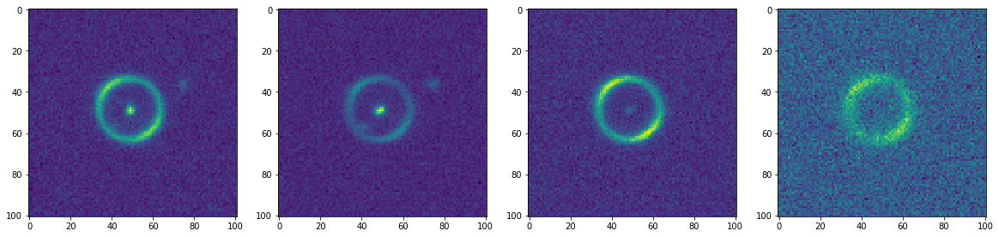

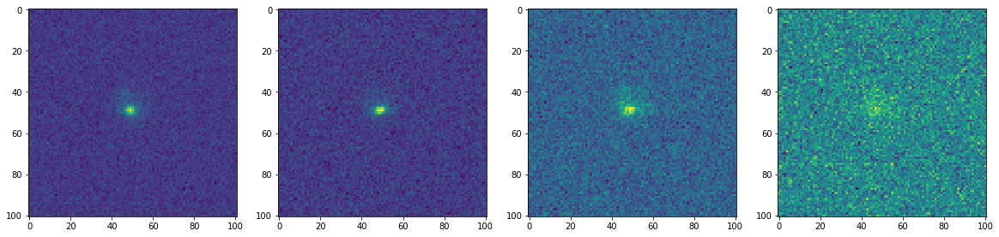

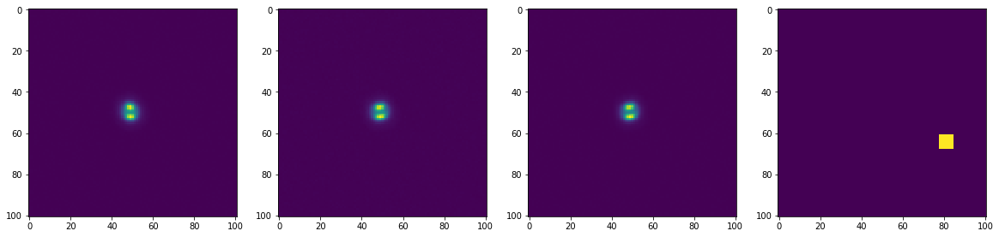

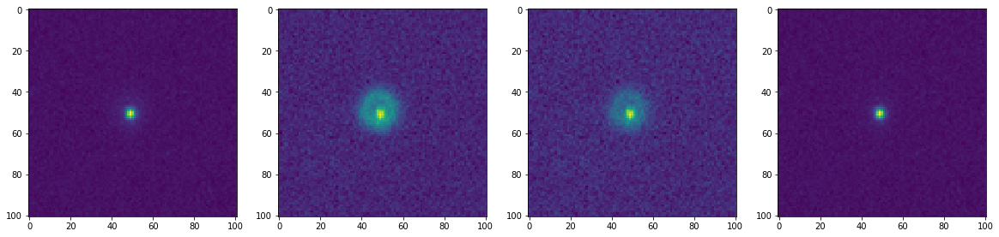

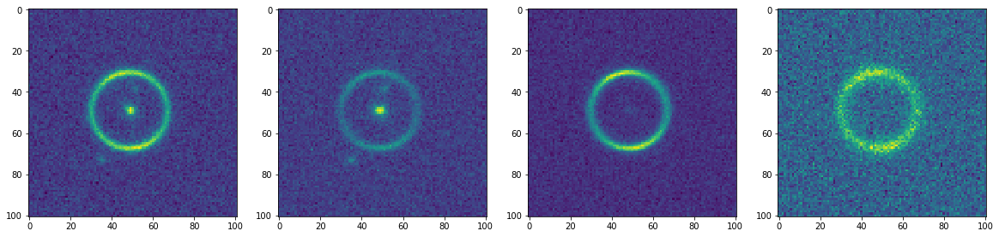

...

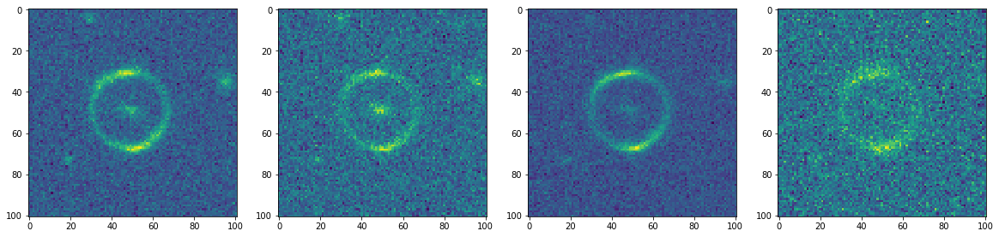

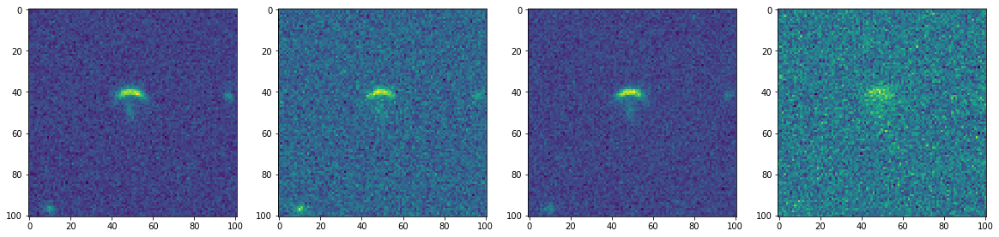

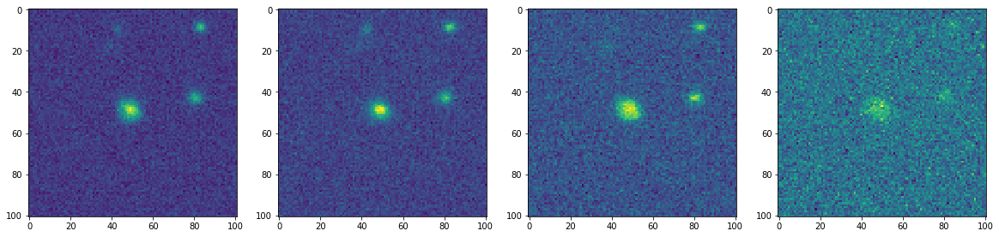

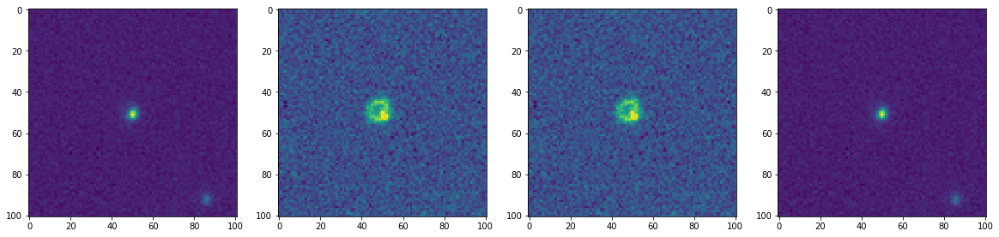

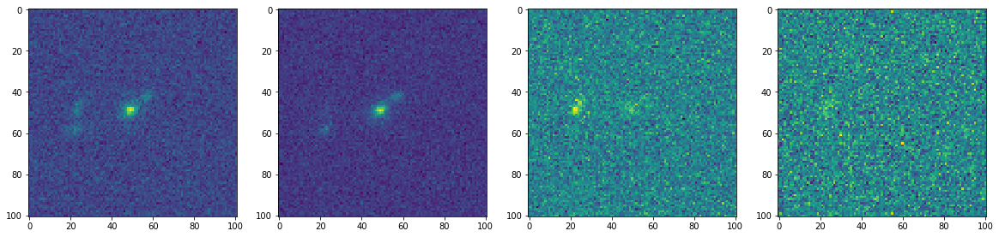

In [90]:

for i in range(50):
    plt.figure(figsize = (20,5))
    plt.subplot(141)
    plt.imshow(X_lens[i][0])
    plt.subplot(142)
    plt.imshow(X_lens[i][1])
    plt.subplot(143) 
    plt.imshow(X_lens[i][2])
    plt.subplot(144)
    plt.imshow(X_lens[i][3])
    plt.show()


In [88]:
idx = y == 0
X_nlens = X[idx]

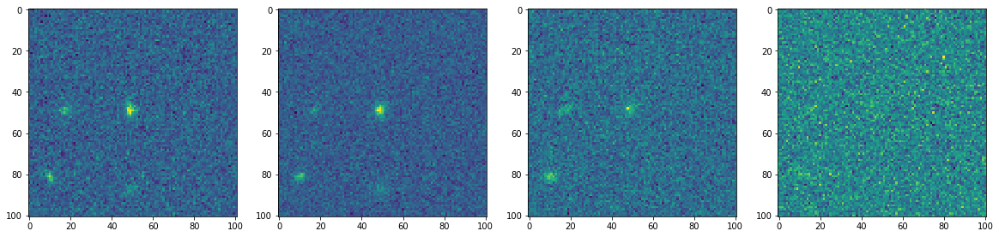

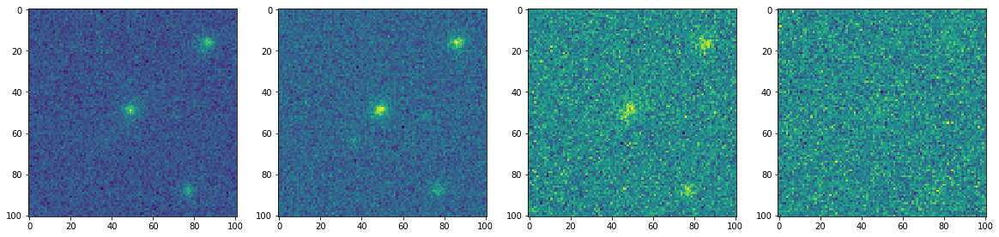

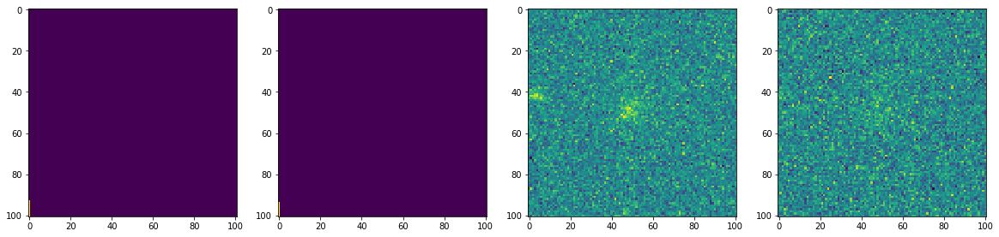

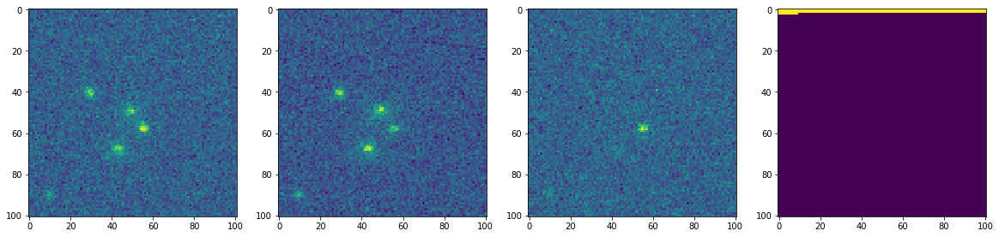

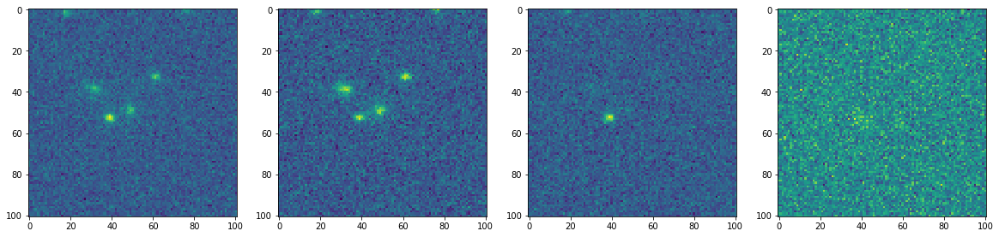

...

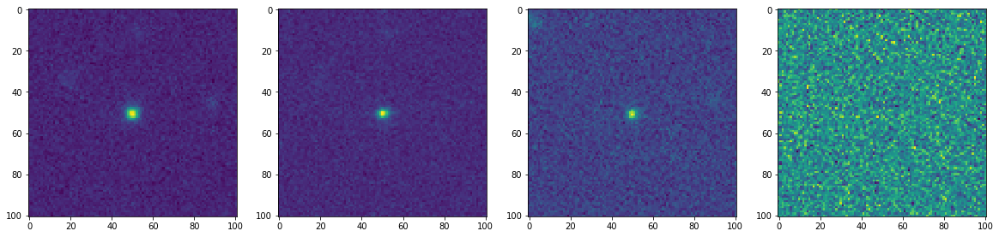

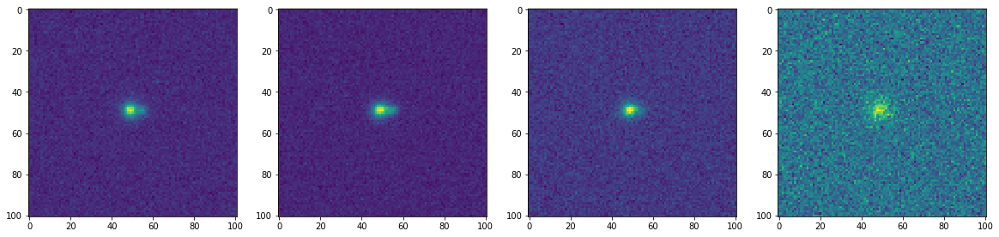

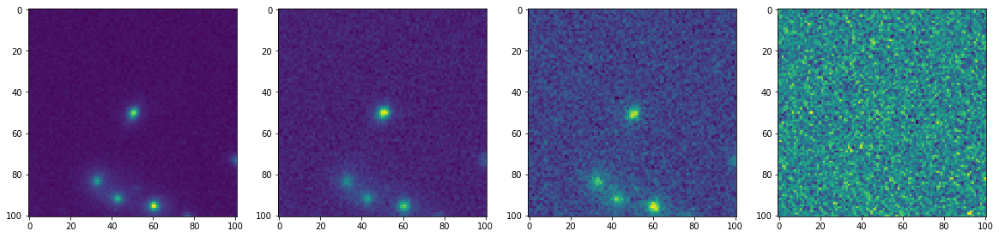

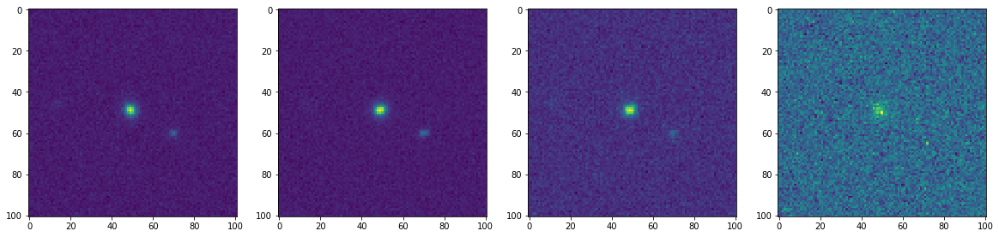

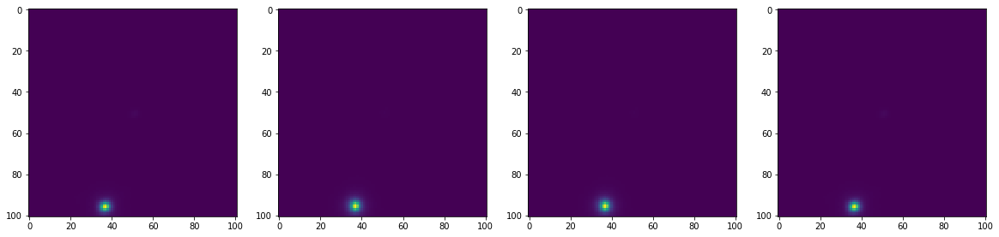

In [89]:
for i in range(20):
    plt.figure(figsize = (20,5))
    plt.subplot(141)
    plt.imshow(X_nlens[i][0])
    plt.subplot(142)
    plt.imshow(X_nlens[i][1])
    plt.subplot(143) 
    plt.imshow(X_nlens[i][2])
    plt.subplot(144)
    plt.imshow(X_nlens[i][3])
    plt.show()

In [29]:
CMU_clf = MLPClassifier(solver="lbfgs", alpha = 10,hidden_layer_sizes=(500,250,125,50), activation = 'relu', \
                random_state=25, max_iter=1e07, learning_rate_init = 1,learning_rate =  'invscaling')

In [30]:
start = time.time()
CMU_clf.fit(X,y)
end = time.time()

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [32]:
predict = CMU_clf.predict(X_test)
print("Training Time: %0.2f" % ((end - start)) + " seconds")
percent_correct = 100*np.sum((y_test==predict)/y_test.shape[0])
print("Percent Correct: %0.8f" % percent_correct +"%")

Training Time: 268.28 seconds
Percent Correct: 54.00000000%


In [33]:
from sklearn.metrics import roc_curve
print(y_test.shape)
print(predict)
print(y_test)
print(np.sum(y_test== predict))
print(np.sum(predict))
print(np.sum(y_test))
counter = 0
if (y_test.any() == 1 & predict.any()==1):
    counter += 1
print(counter)

(150,)
[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0]
[1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 1 0 0 1 0 1 0 1 0 1 0 0
 0 0 1 1 0 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 1 0 1
 0 1 0 0 0 0 1 0 0 1 1 1 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 1 0 0 1 0 0 1 1 1
 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 0 1 1
 1 1]
81
7
76
1


In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, predict)

In [ ]:
plt.title('ROC on Training set')
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.xlim(0,1)
plt.ylim(0,1)
plt.grid(True)

In [15]:
parameters = {'solver': ['lbfgs'], 'alpha': np.arange(0,1,0.1), 'hidden_layer_sizes':np.arange(25,150,25), \
              'random_state':[10,15,20], 'max_iter':[1e04],'learning_rate':['invscaling'],'learning_rate_init' : np.arange(.7,1.3,0.1)}
grid_clf = GridSearchCV(MLPClassifier(), parameters, n_jobs=-1,verbose = 2)

In [16]:
grid_clf.fit(X, y)



Fitting 3 folds for each of 1050 candidates, totalling 3150 fits
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs, total=   4.6s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, ma

[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total=   5.9s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total=  10.0s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs, total=   6.6s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, sol

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.4min


[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs, total=   8.2s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs, total=  23.1s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs, total=  10.1s
[CV] alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, so

[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs, total=   9.3s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs, total=  19.1s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs, total=  21.2s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, sol

[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total=  22.5s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs, total=  28.2s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total=  22.6s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, so

[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=10, solver=lbfgs, total=  17.1s
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs, total=  10.7s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs, total=  15.3s
[CV] alpha=0.0, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, sol

[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total=  11.0s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total=  15.0s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total=  18.2s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, so

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  9.6min


[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs, total=  24.1s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total=  13.4s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs, total=  10.4s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, so

[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs, total=  10.1s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs, total=  14.6s
[CV] alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs, total=  17.7s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, so

[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total=  25.9s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total=  22.5s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs, total=  14.5s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=

[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=15, solver=lbfgs, total=  22.8s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=20, solver=lbfgs, total=  15.1s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=20, solver=lbfgs, total=  26.3s
[CV] alpha=0.0, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=

[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, solver=lbfgs, total=  20.6s
[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs, total=  15.3s
[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=20, solver=lbfgs, total=  27.3s
[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=

[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=10, solver=lbfgs, total=  16.8s
[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs, total=  28.0s
[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs, total=  34.9s
[CV] alpha=0.0, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=

[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=20, solver=lbfgs, total=   8.9s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=10, solver=lbfgs, total=  16.1s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=10, solver=lbfgs, total=  18.2s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, so

[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs, total=  12.4s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, solver=lbfgs, total=  18.4s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs, total=   4.4s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, sol

[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 25.1min


[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs, total=   7.4s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs, total=   9.0s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs, total=  10.6s
[CV] alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=25, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=10, so

[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs, total= 2.1min
[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=10, solver=lbfgs, total=  53.5s
[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=10, solver=lbfgs, total= 1.2min
[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=0.8, max_iter=10000.0, random_state=15, sol

[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, solver=lbfgs, total= 1.2min
[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, solver=lbfgs, total= 1.5min
[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, solver=lbfgs, total=  55.2s
[CV] alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=50, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=15, so

[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=15, solver=lbfgs, total= 2.5min
[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs, total= 3.4min
[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs, total= 4.2min
[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=20, sol

[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=15, solver=lbfgs, total= 2.2min
[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total= 3.5min
[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, solver=lbfgs, total= 1.0min
[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.1, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=20, so

[CV] alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs, total= 1.0min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs, total=  22.3s
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=75, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=20, solver=lbfgs, total= 1.2min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.7, max_iter=10000.0, random_state=10, 

[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total= 2.1min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs, total= 1.4min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=20, solver=lbfgs, total= 3.0min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.0, max_iter=10000.0, random_state=

[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=10, solver=lbfgs, total= 1.6min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=20, solver=lbfgs, total= 3.3min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.2, max_iter=10000.0, random_state=20, solver=lbfgs, total= 4.4min
[CV] alpha=0.1, hidden_layer_sizes=100, learning_rate=invscaling, learning_rate_init=1.3, max_iter=10000.0, random_state=

[CV] alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs, total= 1.8min
[CV] alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=10, solver=lbfgs, total= 5.2min
[CV] alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs 
[CV]  alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=15, solver=lbfgs, total= 4.4min
[CV] alpha=0.1, hidden_layer_sizes=125, learning_rate=invscaling, learning_rate_init=0.9, max_iter=10000.0, random_state=

KeyboardInterrupt: 

In [17]:
print("Best score: %0.4f" % grid_clf.best_score_)
print("Using the following parameters:")
print(grid_clf.best_params_)

AttributeError: 'GridSearchCV' object has no attribute 'best_score_'

# PIPELINE W/ PCA & LOG REG :

In [59]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import linear_model, decomposition, datasets
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split

X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe = train_test_split(X, y, test_size=0.25)

clf_pipe = MLPClassifier(solver="lbfgs", alpha = .575,hidden_layer_sizes=(5,14), activation = 'relu', \
                random_state=10, max_iter=1e04, learning_rate_init = .7,learning_rate =  'invscaling')
pca_60 = decomposition.PCA(n_components=60)
logistic_pipe = linear_model.LogisticRegression()
pipe = Pipeline(steps=[('pca', pca_60), ('logistic', logistic)])

pipe.fit(X_train_pipe,y_train_pipe)

prediction = pipe.predict(X_test_pipe)

np.sum(prediction == y_test_pipe)/y_test_pipe.shape[0]

0.7857142857142857